### 1. NN Training

### Best NN model used

Fold 1, Epoch 1 - Train MSE: 0.288003, MAE: 0.440550, MAPE: 1.53%, 95th: 0.986708 | Val MSE: 0.314938, MAE: 0.525861, MAPE: 1.14%, 95th: 0.844945
Fold 1, Epoch 2 - Train MSE: 0.260873, MAE: 0.415197, MAPE: 1.39%, 95th: 0.943121 | Val MSE: 0.286266, MAE: 0.499914, MAPE: 1.08%, 95th: 0.812793
Fold 1, Epoch 3 - Train MSE: 0.238906, MAE: 0.392687, MAPE: 1.26%, 95th: 0.908822 | Val MSE: 0.261269, MAE: 0.475716, MAPE: 1.02%, 95th: 0.780148
Fold 1, Epoch 4 - Train MSE: 0.216716, MAE: 0.371591, MAPE: 1.18%, 95th: 0.869920 | Val MSE: 0.239632, MAE: 0.453426, MAPE: 0.96%, 95th: 0.750279
Fold 1, Epoch 5 - Train MSE: 0.196290, MAE: 0.352305, MAPE: 1.12%, 95th: 0.834647 | Val MSE: 0.220655, MAE: 0.432733, MAPE: 0.91%, 95th: 0.725816
Fold 1, Epoch 6 - Train MSE: 0.177182, MAE: 0.333168, MAPE: 1.06%, 95th: 0.795390 | Val MSE: 0.203995, MAE: 0.413555, MAPE: 0.87%, 95th: 0.709187
Fold 1, Epoch 7 - Train MSE: 0.159624, MAE: 0.316382, MAPE: 1.03%, 95th: 0.758215 | Val MSE: 0.189158, MAE: 0.395578, MAPE: 

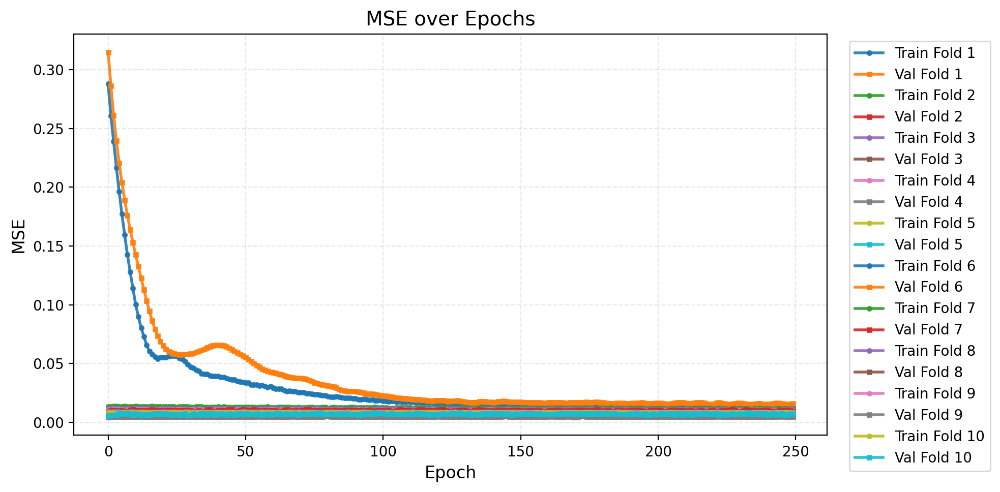

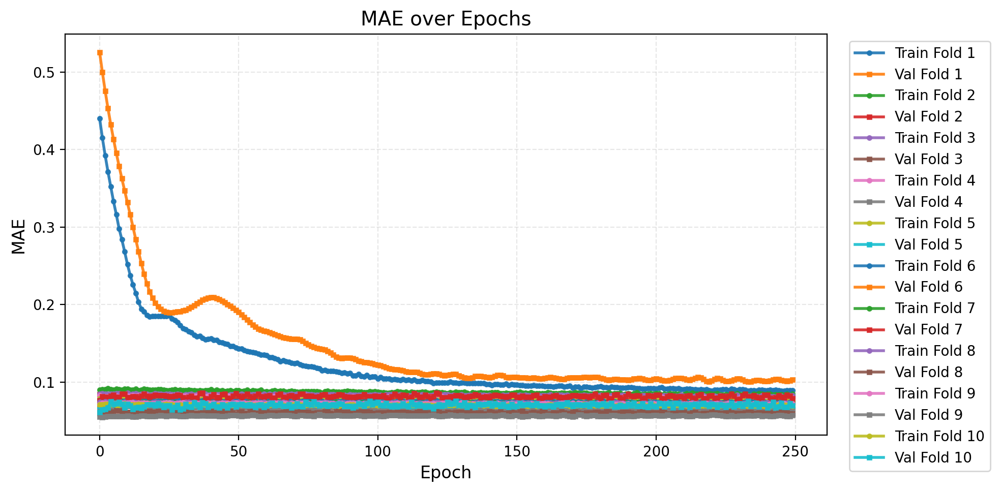

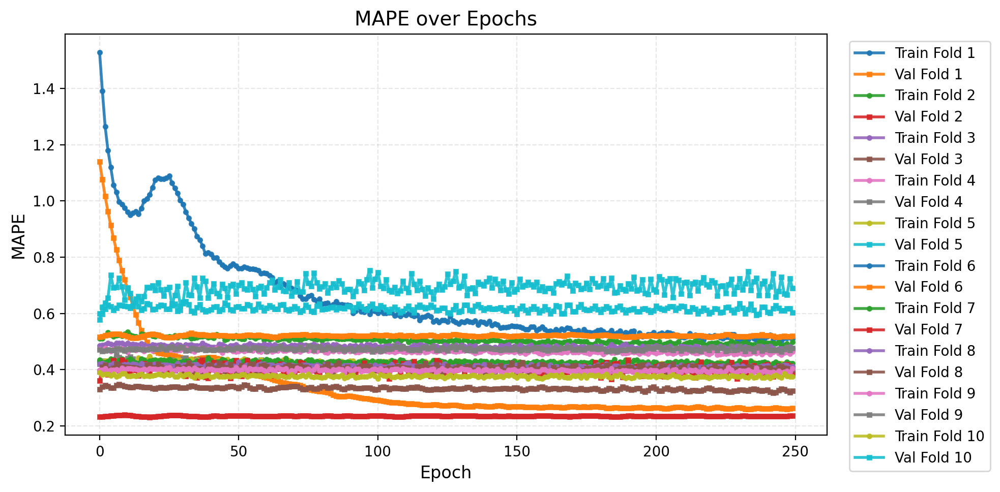

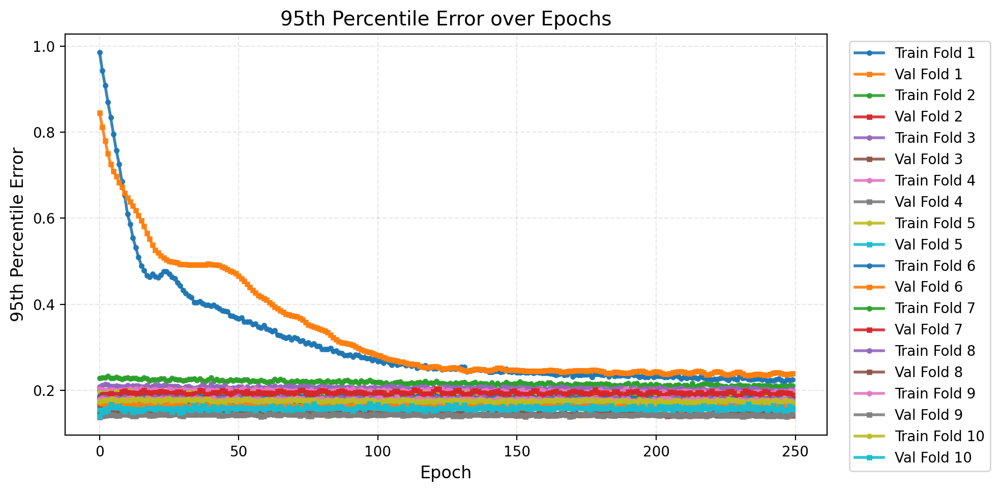

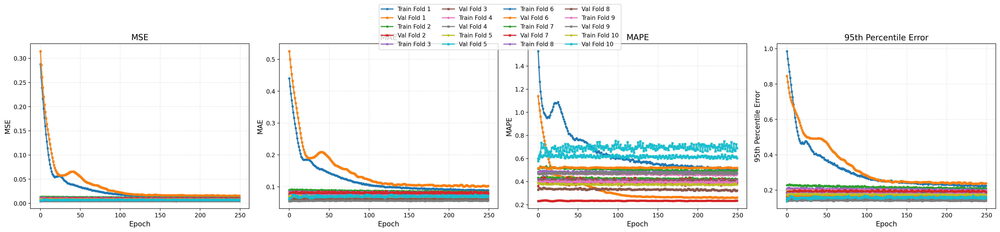


Average Metrics Across Folds (Last Epoch):
Train MSE: 0.009775
Val MSE: 0.008344
Train MAE: 0.076958
Val MAE: 0.072177
Train MAPE: 0.44%
Val MAPE: 0.43%
Train 95th Percentile Error: 0.189879
Val 95th Percentile Error: 0.167607
Neural network training and validation metrics saved to 'nn_metrics.json'.


[I 2025-12-09 10:12:43,407] A new study created in memory with name: no-name-bedfe98f-ff77-47c9-9c58-9fb174d60265
[I 2025-12-09 10:12:43,438] Trial 0 finished with value: 0.5147426128387451 and parameters: {'hidden_size': 52, 'dropout': 0.24210570912979568, 'lr': 0.06091395983106522}. Best is trial 0 with value: 0.5147426128387451.
[I 2025-12-09 10:12:43,462] Trial 1 finished with value: 0.11204761266708374 and parameters: {'hidden_size': 27, 'dropout': 0.20389333388616754, 'lr': 0.00039272815832704837}. Best is trial 1 with value: 0.11204761266708374.
[I 2025-12-09 10:12:43,489] Trial 2 finished with value: 0.25118130445480347 and parameters: {'hidden_size': 40, 'dropout': 0.38328833792831796, 'lr': 0.08687383821519168}. Best is trial 1 with value: 0.11204761266708374.
[I 2025-12-09 10:12:43,526] Trial 3 finished with value: 0.04461904987692833 and parameters: {'hidden_size': 52, 'dropout': 0.3751643648242541, 'lr': 0.010947916195585638}. Best is trial 3 with value: 0.0446190498769283

Best trial:
  Value: 0.04461904987692833
  Params: 
    hidden_size: 52
    dropout: 0.3751643648242541
    lr: 0.010947916195585638

Training environment summary saved to 'training_environment.json'


In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
import random
import platform
import psutil
import torch.backends.cudnn as cudnn


# === Training Environment Summary ===
import time
start_time = time.time()

# Hardware specifications
env_info = {
    "Platform": platform.system(),
    "Platform-Version": platform.version(),
    "Processor": platform.processor(),
    "CPU Cores": psutil.cpu_count(logical=False),
    "Logical CPUs": psutil.cpu_count(logical=True),
    "RAM (GB)": round(psutil.virtual_memory().total / (1024 ** 3), 2),
    "GPU Available": torch.cuda.is_available(),
    "GPU Name": torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None"
}

# Set random seeds for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
cudnn.deterministic = True
cudnn.benchmark = False

# Load datasets from the two CSV files
voltage_df = pd.read_csv("IEEE123VoltageTrain.csv")
features_df = pd.read_csv("IEEE123PQTrain_Irrad.csv")



# Aggregate power features
features_df["P_total"] = features_df[["P1 (kW)", "P2 (kW)", "P3 (kW)"]].sum(axis=1)
features_df["Q_total"] = features_df[["Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)"]].sum(axis=1)

# Extract time features
features_df["Time_stamp"] = pd.to_datetime("2023-" + features_df["Time_stamp"], format="%Y-%m-%d %H:%M")
features_df["hour"] = features_df["Time_stamp"].dt.hour
features_df["minute"] = features_df["Time_stamp"].dt.minute
features_df["day_of_week"] = features_df["Time_stamp"].dt.dayofweek

features_df["hour_sin"] = np.sin(2 * np.pi * features_df["hour"] / 24)
features_df["hour_cos"] = np.cos(2 * np.pi * features_df["hour"] / 24)
features_df["minute_sin"] = np.sin(2 * np.pi * features_df["minute"] / 60)
features_df["minute_cos"] = np.cos(2 * np.pi * features_df["minute"] / 60)
features_df["dow_sin"] = np.sin(2 * np.pi * features_df["day_of_week"] / 7)
features_df["dow_cos"] = np.cos(2 * np.pi * features_df["day_of_week"] / 7)
# Extract month from timestamp
features_df["month"] = features_df["Time_stamp"].dt.month

# Apply sinusoidal encoding for month (cyclic feature)
features_df["month_sin"] = np.sin(2 * np.pi * features_df["month"] / 12)
features_df["month_cos"] = np.cos(2 * np.pi * features_df["month"] / 12)

# Select features including irradiance and temperature
#selected_features = [
      
  #  "P1 (kW)", "P2 (kW)", "P3 (kW)",
   # "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)",
   # "P_total", #"Q_total",
    #"hour_sin", "hour_cos", "minute_sin", "minute_cos",
    #"dow_sin", "dow_cos",
    #"month_sin", "month_cos"] #"Temperature","Irradiance",


# Select features including irradiance and temperature
selected_features = [
"Irradiance",
    "P1 (kW)", "P2 (kW)", "P3 (kW)",
    "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)",
    "P_total", "Q_total",
    "hour_sin", "hour_cos", "minute_sin", "minute_cos",
    "dow_sin", "dow_cos",
    "month_sin", "month_cos"
] #  "Irradiance", "Temperature",#"Temperature",

X_all = features_df[selected_features].values
y_all = voltage_df[["V1", "V2", "V3"]].values

# Split data into training and validation sets
train_size = int(0.8 * len(X_all))
X_train, X_val = X_all[:train_size], X_all[train_size:]
y_train, y_val = y_all[:train_size], y_all[train_size:]

# Normalize and save scalers
scaler_X = MinMaxScaler((-1, 1)).fit(X_train)
scaler_y = MinMaxScaler((-1, 1)).fit(y_train)

joblib.dump(scaler_X, 'scaler_X.save')
joblib.dump(scaler_y, 'scaler_y.save')

# Transform data
X_train = torch.tensor(scaler_X.transform(X_train), dtype=torch.float32)
X_val = torch.tensor(scaler_X.transform(X_val), dtype=torch.float32)
y_train = torch.tensor(scaler_y.transform(y_train), dtype=torch.float32)
y_val = torch.tensor(scaler_y.transform(y_val), dtype=torch.float32)

# Define model with dropout layers
class VoltageNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(VoltageNN, self).__init__()
        self.hidden1 = nn.Linear(input_size, hidden_size)
        self.hidden2 = nn.Linear(hidden_size, hidden_size)
        self.output = nn.Linear(hidden_size, output_size)
        self.tanh = nn.Tanh()
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        x = self.tanh(self.hidden1(x))
        x = self.dropout(x)
        x = self.tanh(self.hidden2(x))
        x = self.dropout(x)
        x = self.output(x)
        return x

# Training setup
input_size = X_train.shape[1]
hidden_size = 64
output_size = y_train.shape[1]
model = VoltageNN(input_size, hidden_size, output_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Blocked Cross Validation
k = 10
n = len(X_train)
fold_size = n // k

# Store metrics
train_mse_all, val_mse_all = [], []
train_mae_all, val_mae_all = [], []
train_mape_all, val_mape_all = [], []
train_p95_all, val_p95_all = [], []

for fold in range(k):
    val_start = fold * fold_size
    val_end = val_start + fold_size
    if val_end > n:
        val_end = n

    X_train_fold = torch.cat((X_train[:val_start], X_train[val_end:]), dim=0)
    y_train_fold = torch.cat((y_train[:val_start], y_train[val_end:]), dim=0)
    X_val_fold = X_train[val_start:val_end]
    y_val_fold = y_train[val_start:val_end]

    if len(X_val_fold) == 0 or len(y_val_fold) == 0:
        print(f"Skipping fold {fold+1} due to empty validation data.")
        continue

    train_mse, val_mse = [], []
    train_mae, val_mae = [], []
    train_mape, val_mape = [], []
    train_p95, val_p95 = [], []

    for epoch in range(250):
        model.train()
        pred_train = model(X_train_fold)
        loss_mse = criterion(pred_train, y_train_fold)
        loss_mae = mean_absolute_error(y_train_fold.detach().numpy(), pred_train.detach().numpy())
        loss_mape = mean_absolute_percentage_error(y_train_fold.detach().numpy(), pred_train.detach().numpy())
        p95 = np.percentile(np.abs(y_train_fold.detach().numpy() - pred_train.detach().numpy()), 95)

        optimizer.zero_grad()
        loss_mse.backward()
        optimizer.step()

        model.eval()
        pred_val = model(X_val_fold)
        val_loss_mse = criterion(pred_val, y_val_fold)
        val_loss_mae = mean_absolute_error(y_val_fold.detach().numpy(), pred_val.detach().numpy())
        val_loss_mape = mean_absolute_percentage_error(y_val_fold.detach().numpy(), pred_val.detach().numpy())
        val_p95_error = np.percentile(np.abs(y_val_fold.detach().numpy() - pred_val.detach().numpy()), 95)
        
        print(f"Fold {fold+1}, Epoch {epoch+1} - "
              f"Train MSE: {loss_mse.item():.6f}, MAE: {loss_mae:.6f}, MAPE: {loss_mape:.2f}%, 95th: {p95:.6f} | "
              f"Val MSE: {val_loss_mse.item():.6f}, MAE: {val_loss_mae:.6f}, MAPE: {val_loss_mape:.2f}%, 95th: {val_p95_error:.6f}")

        #print(f"Fold {fold+1}, Epoch {epoch+1} - "
              #f"Train MSE: {loss_mse.item():.6f}, MAE: {loss_mae:.6f}, MAPE: {train_loss_mape:.2f}%, 95th: {train_95th_percentile:.6f} | "
             # f"Val MSE: {val_loss_mse.item():.6f}, MAE: {val_loss_mae:.6f}, MAPE: {val_loss_mape:.2f}%, 95th: {val_95th_percentile:.6f}")

        train_mse.append(loss_mse.item())
        val_mse.append(val_loss_mse.item())
        train_mae.append(loss_mae)
        val_mae.append(val_loss_mae)
        train_mape.append(loss_mape)
        val_mape.append(val_loss_mape)
        train_p95.append(p95)
        val_p95.append(val_p95_error)

    train_mse_all.append(train_mse)
    val_mse_all.append(val_mse)
    train_mae_all.append(train_mae)
    val_mae_all.append(val_mae)
    train_mape_all.append(train_mape)
    val_mape_all.append(val_mape)
    train_p95_all.append(train_p95)
    val_p95_all.append(val_p95)


# Save model
torch.save(model.state_dict(), 'voltage_model.pth')
print("Model training complete and saved as 'voltage_model.pth'.")

# Plot metrics

import matplotlib.pyplot as plt
import matplotlib as mpl

# ---- Presentation: legible fonts & high resolution ----
mpl.rcParams['figure.dpi'] = 200          # On-screen clarity
mpl.rcParams['savefig.dpi'] = 300         # Export clarity (print-quality)
mpl.rcParams['font.family'] = 'DejaVu Sans'  # Readable default
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['legend.fontsize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
mpl.rcParams['axes.grid'] = True          # Subtle grid for readability
mpl.rcParams['grid.linestyle'] = '--'
mpl.rcParams['grid.alpha'] = 0.3

# ---- Single-metric plot helper ----
def plot_metric(metric_list_train, metric_list_val, title, ylabel, filename):
    plt.figure(figsize=(10, 5))
    for fold in range(len(metric_list_train)):
        # Slightly thicker lines; optional markers for clarity
        plt.plot(metric_list_train[fold], label=f'Train Fold {fold+1}',
                 linewidth=2, marker='o', markersize=3, alpha=0.9)
        plt.plot(metric_list_val[fold], label=f'Val Fold {fold+1}',
                 linewidth=2, marker='s', markersize=3, alpha=0.9)
    plt.xlabel('Epoch')
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True)
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')  # ensure nothing is clipped
    plt.show()

# ---- Individual metric plots ----
plot_metric(train_mse_all,  val_mse_all,  'MSE over Epochs',                    'MSE',                    'mse_plot.png')
plot_metric(train_mae_all,  val_mae_all,  'MAE over Epochs',                    'MAE',                    'mae_plot.png')
plot_metric(train_mape_all, val_mape_all, 'MAPE over Epochs',                   'MAPE',                   'mape_plot.png')
plot_metric(train_p95_all,  val_p95_all,  '95th Percentile Error over Epochs',  '95th Percentile Error',  'p95_plot.png')

# ---- 1x4 subplot layout with shared legend ----
fig, axes = plt.subplots(1, 4, figsize=(24, 5), sharey=False)

metrics_data = [
    (train_mse_all,  val_mse_all,  'MSE',                     'MSE'),
    (train_mae_all,  val_mae_all,  'MAE',                     'MAE'),
    (train_mape_all, val_mape_all, 'MAPE',                    'MAPE'),
    (train_p95_all,  val_p95_all,  '95th Percentile Error',   '95th Percentile Error')
]

handles, labels = None, None

for idx, (train_metric, val_metric, title, ylabel) in enumerate(metrics_data):
    ax = axes[idx]
    for fold in range(len(train_metric)):
        line1, = ax.plot(train_metric[fold], label=f'Train Fold {fold+1}',
                         linewidth=2, marker='o', markersize=3, alpha=0.9)
        line2, = ax.plot(val_metric[fold], label=f'Val Fold {fold+1}',
                         linewidth=2, marker='s', markersize=3, alpha=0.9)
    ax.set_title(title)
    ax.set_xlabel('Epoch')
    ax.set_ylabel(ylabel)
    ax.grid(True)
    if idx == 0:
        handles, labels = ax.get_legend_handles_labels()

# Shared legend above subplots, readable and unclipped
fig.legend(handles, labels, loc='upper center',
           bbox_to_anchor=(0.5, 1.12), ncol=4, frameon=True)

plt.tight_layout()
plt.savefig("metrics_subplot.png", bbox_inches='tight')  # high-res export
plt.show()

# Print average metrics
print("\nAverage Metrics Across Folds (Last Epoch):")
print(f"Train MSE: {np.mean([fold[-1] for fold in train_mse_all]):.6f}")
print(f"Val MSE: {np.mean([fold[-1] for fold in val_mse_all]):.6f}")
print(f"Train MAE: {np.mean([fold[-1] for fold in train_mae_all]):.6f}")
print(f"Val MAE: {np.mean([fold[-1] for fold in val_mae_all]):.6f}")
print(f"Train MAPE: {np.mean([fold[-1] for fold in train_mape_all]):.2f}%")
print(f"Val MAPE: {np.mean([fold[-1] for fold in val_mape_all]):.2f}%")
print(f"Train 95th Percentile Error: {np.mean([fold[-1] for fold in train_p95_all]):.6f}")
print(f"Val 95th Percentile Error: {np.mean([fold[-1] for fold in val_p95_all]):.6f}")


import json
import numpy as np

# Assuming the following lists are already populated from training:
# train_mse_all, val_mse_all, train_mae_all, val_mae_all, train_mape_all, val_mape_all, train_p95_all, val_p95_all

# Extract last epoch metrics from each fold
nn_metrics = {
    "Train MSE": float(np.mean([fold[-1] for fold in train_mse_all])),
    "Val MSE": float(np.mean([fold[-1] for fold in val_mse_all])),
    "Train MAE": float(np.mean([fold[-1] for fold in train_mae_all])),
    "Val MAE": float(np.mean([fold[-1] for fold in val_mae_all])),
    "Train MAPE": float(np.mean([fold[-1] for fold in train_mape_all])),
    "Val MAPE": float(np.mean([fold[-1] for fold in val_mape_all])),
    "Train 95th Percentile Error": float(np.mean([fold[-1] for fold in train_p95_all])),
    "Val 95th Percentile Error": float(np.mean([fold[-1] for fold in val_p95_all]))
}

# Save to JSON file
with open("nn_metrics.json", "w") as f:
    json.dump(nn_metrics, f, indent=4)

print("Neural network training and validation metrics saved to 'nn_metrics.json'.")

# ------------------ Optuna Hyperparameter Optimization ------------------
import optuna

def objective(trial):
    hidden_size = trial.suggest_int('hidden_size', 8, 64)
    dropout_rate = trial.suggest_float('dropout', 0.1, 0.5)
    lr = trial.suggest_float('lr', 1e-4, 1e-1, log=True)

    model = VoltageNN(input_size, hidden_size, output_size)
    model.dropout = nn.Dropout(p=dropout_rate)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    subset_size = min(1000, len(X_train))
    X_sub = X_train[:subset_size]
    y_sub = y_train[:subset_size]

    for epoch in range(10):
        model.train()
        pred = model(X_sub)
        loss = criterion(pred, y_sub)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        val_pred = model(X_val)
        val_loss = criterion(val_pred, y_val).item()

    return val_loss

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

print("Best trial:")
print(f"  Value: {study.best_trial.value}")
print("  Params: ")
for key, value in study.best_trial.params.items():
    print(f"    {key}: {value}")
# ------------------------------------------------------------------------

# === Save Training Environment Info ===
end_time = time.time()
env_info["Training Time (s)"] = round(end_time - start_time, 2)

with open("training_environment.json", "w") as f:
    json.dump(env_info, f, indent=4)

print("\nTraining environment summary saved to 'training_environment.json'")


#### Presentation legible plots

#### 2. Baseline models

### Best Baseline model parameters used

In [3]:
import pandas as pd
import numpy as np
import joblib
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from xgboost import XGBRegressor
import json

# Load datasets from the two CSV files
voltage_df = pd.read_csv("IEEE123VoltageTrain.csv")
features_df = pd.read_csv("IEEE123PQTrain_Irrad.csv")

# Aggregate power features
features_df["P_total"] = features_df[["P1 (kW)", "P2 (kW)", "P3 (kW)"]].sum(axis=1)
features_df["Q_total"] = features_df[["Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)"]].sum(axis=1)

# Extract time features
features_df["Time_stamp"] = pd.to_datetime("2023-" + features_df["Time_stamp"], format="%Y-%m-%d %H:%M")
features_df["hour"] = features_df["Time_stamp"].dt.hour
features_df["minute"] = features_df["Time_stamp"].dt.minute
features_df["day_of_week"] = features_df["Time_stamp"].dt.dayofweek
features_df["month"] = features_df["Time_stamp"].dt.month

# Sinusoidal encoding
features_df["hour_sin"] = np.sin(2 * np.pi * features_df["hour"] / 24)
features_df["hour_cos"] = np.cos(2 * np.pi * features_df["hour"] / 24)
features_df["minute_sin"] = np.sin(2 * np.pi * features_df["minute"] / 60)
features_df["minute_cos"] = np.cos(2 * np.pi * features_df["minute"] / 60)
features_df["dow_sin"] = np.sin(2 * np.pi * features_df["day_of_week"] / 7)
features_df["dow_cos"] = np.cos(2 * np.pi * features_df["day_of_week"] / 7)
features_df["month_sin"] = np.sin(2 * np.pi * features_df["month"] / 12)
features_df["month_cos"] = np.cos(2 * np.pi * features_df["month"] / 12)

# Select features including irradiance and temperature
selected_features = [
"Irradiance",
    "P1 (kW)", "P2 (kW)", "P3 (kW)",
    "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)",
    "P_total", "Q_total",
    "hour_sin", "hour_cos", "minute_sin", "minute_cos",
    "dow_sin", "dow_cos",
    "month_sin", "month_cos"
] 

X_all = features_df[selected_features].values
y_all = voltage_df[["V1", "V2", "V3"]].values

# Split data
train_size = int(0.8 * len(X_all))
X_train, X_val = X_all[:train_size], X_all[train_size:]
y_train, y_val = y_all[:train_size], y_all[train_size:]

# Normalize using saved scalers
scaler_X = joblib.load('scaler_X.save')
scaler_y = joblib.load('scaler_y.save')
X_train_scaled = scaler_X.transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
y_train_scaled = scaler_y.transform(y_train)
y_val_scaled = scaler_y.transform(y_val)

# Function to compute metrics
def compute_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    p95 = np.percentile(np.abs(y_true - y_pred), 95)
    return mse, mae, mape, p95

# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train_scaled)
lr_pred_train = lr_model.predict(X_train_scaled)
lr_pred_val = lr_model.predict(X_val_scaled)
lr_train_metrics = compute_metrics(y_train_scaled, lr_pred_train)
lr_val_metrics = compute_metrics(y_val_scaled, lr_pred_val)

# Save Linear Regression model coefficients and intercept
joblib.dump(lr_model.coef_, "lr_model_coef.save")
joblib.dump(lr_model.intercept_, "lr_model_intercept.save")

# XGBoost
xgb_model = XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, objective='reg:squarederror')
xgb_model.fit(X_train_scaled, y_train_scaled)
xgb_pred_train = xgb_model.predict(X_train_scaled)
xgb_pred_val = xgb_model.predict(X_val_scaled)
xgb_train_metrics = compute_metrics(y_train_scaled, xgb_pred_train)
xgb_val_metrics = compute_metrics(y_val_scaled, xgb_pred_val)

# Save XGBoost model
joblib.dump(xgb_model, "xgb_model.save")

# Load NN metrics from saved JSON file
with open("nn_metrics.json", "r") as f:
    nn_metrics = json.load(f)

# Extract values
metrics_names = ['MSE', 'MAE', 'MAPE', '95th Percentile Error']
nn_train_values = [nn_metrics['Train MSE'], nn_metrics['Train MAE'], nn_metrics['Train MAPE'], nn_metrics['Train 95th Percentile Error']]
nn_val_values = [nn_metrics['Val MSE'], nn_metrics['Val MAE'], nn_metrics['Val MAPE'], nn_metrics['Val 95th Percentile Error']]
lr_train_values = list(lr_train_metrics)
lr_val_values = list(lr_val_metrics)
xgb_train_values = list(xgb_train_metrics)
xgb_val_values = list(xgb_val_metrics)

# Save metrics to CSV
metrics_df = pd.DataFrame({
    'Metric': metrics_names,
    'NN_Train': nn_train_values,
    'NN_Val': nn_val_values,
    'LR_Train': lr_train_values,
    'LR_Val': lr_val_values,
    'XGB_Train': xgb_train_values,
    'XGB_Val': xgb_val_values
})
metrics_df.to_csv('Metrics_comparison.csv', index=False)



### Randomized XGB parameter search

In [6]:
import pandas as pd
import numpy as np
import joblib
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor
import json

# Load datasets from the two CSV files
voltage_df = pd.read_csv("IEEE123VoltageTrain.csv")
features_df = pd.read_csv("IEEE123PQTrain_Irrad.csv")

# Aggregate power features
features_df["P_total"] = features_df[["P1 (kW)", "P2 (kW)", "P3 (kW)"]].sum(axis=1)
features_df["Q_total"] = features_df[["Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)"]].sum(axis=1)

# Extract time features
features_df["Time_stamp"] = pd.to_datetime("2023-" + features_df["Time_stamp"], format="%Y-%m-%d %H:%M")
features_df["hour"] = features_df["Time_stamp"].dt.hour
features_df["minute"] = features_df["Time_stamp"].dt.minute
features_df["day_of_week"] = features_df["Time_stamp"].dt.dayofweek
features_df["month"] = features_df["Time_stamp"].dt.month

# Sinusoidal encoding
features_df["hour_sin"] = np.sin(2 * np.pi * features_df["hour"] / 24)
features_df["hour_cos"] = np.cos(2 * np.pi * features_df["hour"] / 24)
features_df["minute_sin"] = np.sin(2 * np.pi * features_df["minute"] / 60)
features_df["minute_cos"] = np.cos(2 * np.pi * features_df["minute"] / 60)
features_df["dow_sin"] = np.sin(2 * np.pi * features_df["day_of_week"] / 7)
features_df["dow_cos"] = np.cos(2 * np.pi * features_df["day_of_week"] / 7)
features_df["month_sin"] = np.sin(2 * np.pi * features_df["month"] / 12)
features_df["month_cos"] = np.cos(2 * np.pi * features_df["month"] / 12)

# Select features including irradiance and temperature
selected_features = [
    "Irradiance",
    "P1 (kW)", "P2 (kW)", "P3 (kW)",
    "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)",
    "P_total", "Q_total",
    "hour_sin", "hour_cos", "minute_sin", "minute_cos",
    "dow_sin", "dow_cos",
    "month_sin", "month_cos"
]

X_all = features_df[selected_features].values
y_all = voltage_df[["V1", "V2", "V3"]].values

# Split data
train_size = int(0.8 * len(X_all))
X_train, X_val = X_all[:train_size], X_all[train_size:]
y_train, y_val = y_all[:train_size], y_all[train_size:]

# Normalize using saved scalers
scaler_X = joblib.load('scaler_X.save')
scaler_y = joblib.load('scaler_y.save')
X_train_scaled = scaler_X.transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
y_train_scaled = scaler_y.transform(y_train)
y_val_scaled = scaler_y.transform(y_val)

# Function to compute metrics
def compute_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    p95 = np.percentile(np.abs(y_true - y_pred), 95)
    return mse, mae, mape, p95

# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train_scaled)
lr_pred_train = lr_model.predict(X_train_scaled)
lr_pred_val = lr_model.predict(X_val_scaled)
lr_train_metrics = compute_metrics(y_train_scaled, lr_pred_train)
lr_val_metrics = compute_metrics(y_val_scaled, lr_pred_val)

# Save Linear Regression model coefficients,intercept and model
#joblib.dump(lr_model.coef_, "lr_model_coef.save")
#joblib.dump(lr_model.intercept_, "lr_model_intercept.save")
joblib.dump(lr_model, "lr_model.save")

# XGBoost with RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.5],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [0.1, 1, 10]
}

xgb_model = XGBRegressor(objective='reg:squarederror')
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=20,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)
random_search.fit(X_train_scaled, y_train_scaled)
print("Best parameters from RandomizedSearchCV:")
print(random_search.best_params_)

# Use best estimator
best_xgb_model = random_search.best_estimator_
xgb_pred_train = best_xgb_model.predict(X_train_scaled)
xgb_pred_val = best_xgb_model.predict(X_val_scaled)
xgb_train_metrics = compute_metrics(y_train_scaled, xgb_pred_train)
xgb_val_metrics = compute_metrics(y_val_scaled, xgb_pred_val)

# Save XGBoost model
joblib.dump(best_xgb_model, "xgb_model.save")

# Load NN metrics from saved JSON file
with open("nn_metrics.json", "r") as f:
    nn_metrics = json.load(f)

# Extract values
metrics_names = ['MSE', 'MAE', 'MAPE', '95th Percentile Error']
nn_train_values = [nn_metrics['Train MSE'], nn_metrics['Train MAE'], nn_metrics['Train MAPE'], nn_metrics['Train 95th Percentile Error']]
nn_val_values = [nn_metrics['Val MSE'], nn_metrics['Val MAE'], nn_metrics['Val MAPE'], nn_metrics['Val 95th Percentile Error']]
lr_train_values = list(lr_train_metrics)
lr_val_values = list(lr_val_metrics)
xgb_train_values = list(xgb_train_metrics)
xgb_val_values = list(xgb_val_metrics)

# Save metrics to CSV
metrics_df = pd.DataFrame({
    'Metric': metrics_names,
    'NN_Train': nn_train_values,
    'NN_Val': nn_val_values,
    'LR_Train': lr_train_values,
    'LR_Val': lr_val_values,
    'XGB_Train': xgb_train_values,
    'XGB_Val': xgb_val_values
})
metrics_df.to_csv('3modelsMetrics_comparison.csv', index=False)



Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters from RandomizedSearchCV:
{'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.6}


#### Plot of performance comparison

#### Presentation plots

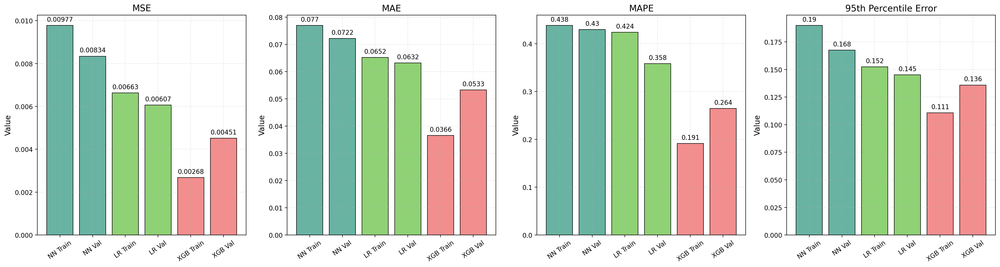

In [6]:

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

# ---- Presentation: legible fonts & high resolution ----
mpl.rcParams['figure.dpi'] = 200           # On-screen clarity
mpl.rcParams['savefig.dpi'] = 300          # Export clarity (print-quality)
mpl.rcParams['font.family'] = 'DejaVu Sans'
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

# Load the metrics comparison data from the CSV file
df = pd.read_csv("3modelsMetrics_comparison.csv")

# Extract metric names and values
metrics = df['Metric'].tolist()
nn_train = df['NN_Train'].tolist()
nn_val   = df['NN_Val'].tolist()
lr_train = df['LR_Train'].tolist()
lr_val   = df['LR_Val'].tolist()
xgb_train = df['XGB_Train'].tolist()
xgb_val   = df['XGB_Val'].tolist()

# Create subplots for each metric
fig, axes = plt.subplots(1, 4, figsize=(22, 6), sharey=False)

model_names = ['NN Train', 'NN Val', 'LR Train', 'LR Val', 'XGB Train', 'XGB Val']
bar_colors  = ['#69b3a2', '#69b3a2',   # NN (train/val)
               '#8fd175', '#8fd175',   # LR (train/val)
               '#f28e8e', '#f28e8e']   # XGB (train/val)

for i, metric in enumerate(metrics):
    values = [nn_train[i], nn_val[i], lr_train[i], lr_val[i], xgb_train[i], xgb_val[i]]
    ax = axes[i]
    bars = ax.bar(model_names, values, color=bar_colors, edgecolor='black', linewidth=0.8)
    ax.set_title(metric)
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=35)
    ax.grid(axis='y', linestyle='--', alpha=0.3)

    # Optional: add value labels on bars for readability
    for b in bars:
        height = b.get_height()
        ax.annotate(f'{height:.3g}',                      # format to 3 significant digits
                    xy=(b.get_x() + b.get_width()/2, height),
                    xytext=(0, 4), textcoords="offset points",
                    ha='center', va='bottom', fontsize=10)

# Tight layout & high-res export without clipping
plt.tight_layout()
plt.savefig('model_metrics_comparison_subplots.png', bbox_inches='tight')


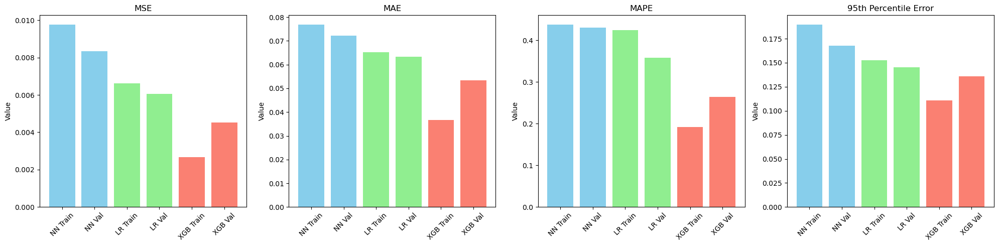

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the metrics comparison data from the CSV file
df = pd.read_csv("3modelsMetrics_comparison.csv")

# Extract metric names and values
metrics = df['Metric'].tolist()
nn_train = df['NN_Train'].tolist()
nn_val = df['NN_Val'].tolist()
lr_train = df['LR_Train'].tolist()
lr_val = df['LR_Val'].tolist()
xgb_train = df['XGB_Train'].tolist()
xgb_val = df['XGB_Val'].tolist()

# Create subplots for each metric
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
model_names = ['NN Train', 'NN Val', 'LR Train', 'LR Val', 'XGB Train', 'XGB Val']

for i, metric in enumerate(metrics):
    values = [nn_train[i], nn_val[i], lr_train[i], lr_val[i], xgb_train[i], xgb_val[i]]
    axes[i].bar(model_names, values, color=['skyblue', 'skyblue', 'lightgreen', 'lightgreen', 'salmon', 'salmon'])
    axes[i].set_title(metric)
    axes[i].set_ylabel('Value')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('model_metrics_comparison_subplots.png')
plt.show()

#### NN Deployment

In [12]:
### import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import joblib

# Define the model architecture
class VoltageNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(VoltageNN, self).__init__()
        self.hidden1 = nn.Linear(input_size, hidden_size)
        self.hidden2 = nn.Linear(hidden_size, hidden_size)
        self.output = nn.Linear(hidden_size, output_size)
        self.tanh = nn.Tanh()
        self.dropout = nn.Dropout(p=0.2) ## 0.10303200089297368

    def forward(self, x):
        x = self.tanh(self.hidden1(x))
        x = self.dropout(x)
        x = self.tanh(self.hidden2(x))
        x = self.dropout(x)
        x = self.output(x)
        return x

# Load and preprocess the new dataset
new_data = pd.read_csv("IEEE123PQPredict_Irrad.csv")
new_data['datetime'] = pd.to_datetime(new_data.iloc[:, 0], format='%m-%d %H:%M', errors='coerce')
new_data = new_data.dropna(subset=['datetime'])

# Feature engineering
new_data['hour'] = new_data['datetime'].dt.hour
new_data['minute'] = new_data['datetime'].dt.minute
new_data['dayofweek'] = new_data['datetime'].dt.dayofweek
new_data['month'] = new_data['datetime'].dt.month

# Sinusoidal encodings
new_data['hour_sin'] = np.sin(2 * np.pi * new_data['hour'] / 24)
new_data['hour_cos'] = np.cos(2 * np.pi * new_data['hour'] / 24)
new_data['minute_sin'] = np.sin(2 * np.pi * new_data['minute'] / 60)
new_data['minute_cos'] = np.cos(2 * np.pi * new_data['minute'] / 60)
new_data['dow_sin'] = np.sin(2 * np.pi * new_data['dayofweek'] / 7)
new_data['dow_cos'] = np.cos(2 * np.pi * new_data['dayofweek'] / 7)
new_data['month_sin'] = np.sin(2 * np.pi * new_data['month'] / 12)
new_data['month_cos'] = np.cos(2 * np.pi * new_data['month'] / 12)

# Aggregate power features
new_data['P_total'] = new_data["P1 (kW)"] + new_data["P2 (kW)"] + new_data["P3 (kW)"]
new_data['Q_total'] = new_data["Q1 (kvar)"] + new_data["Q2 (kvar)"] + new_data["Q3 (kvar)"]

# Select features including irradiance and temperature
selected_features = [
"Irradiance",
    "P1 (kW)", "P2 (kW)", "P3 (kW)",
    "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)",
    "P_total", "Q_total",
    "hour_sin", "hour_cos", "minute_sin", "minute_cos",
    "dow_sin", "dow_cos",
    "month_sin", "month_cos"
] 

X_new = new_data[selected_features]

# Load scalers and model
scaler_X = joblib.load("scaler_X.save")
scaler_y = joblib.load("scaler_y.save")
input_size = X_new.shape[1]
hidden_size = 64 #76 #64
output_size = 3
model = VoltageNN(input_size, hidden_size, output_size)
model.load_state_dict(torch.load("voltage_model.pth"))
model.eval()

# Scale and predict
X_scaled = scaler_X.transform(X_new.values)
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
with torch.no_grad():
    predictions = model(X_tensor).numpy()
predicted_voltage = scaler_y.inverse_transform(predictions)

# Save predictions
pd.DataFrame(predicted_voltage, columns=["NN_Predicted_V1", "NN_Predicted_V2", "NN_Predicted_V3"]).to_csv("NN_PredictedVoltageNew.csv", index=False)
print("Predictions saved to NN_PredictedVoltageNew.csv.")


Predictions saved to NN_PredictedVoltageNew.csv.


#### Deployment of baseline models

In [15]:
import pandas as pd
import numpy as np
import joblib
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor

# Load new dataset
new_data = pd.read_csv("IEEE123PQPredict_Irrad.csv")
new_data['datetime'] = pd.to_datetime(new_data.iloc[:, 0], format='%m-%d %H:%M', errors='coerce')
new_data = new_data.dropna(subset=['datetime'])

# Feature engineering
new_data['hour'] = new_data['datetime'].dt.hour
new_data['minute'] = new_data['datetime'].dt.minute
new_data['dayofweek'] = new_data['datetime'].dt.dayofweek
new_data['month'] = new_data['datetime'].dt.month

# Sinusoidal encodings
new_data['hour_sin'] = np.sin(2 * np.pi * new_data['hour'] / 24)
new_data['hour_cos'] = np.cos(2 * np.pi * new_data['hour'] / 24)
new_data['minute_sin'] = np.sin(2 * np.pi * new_data['minute'] / 60)
new_data['minute_cos'] = np.cos(2 * np.pi * new_data['minute'] / 60)
new_data['dow_sin'] = np.sin(2 * np.pi * new_data['dayofweek'] / 7)
new_data['dow_cos'] = np.cos(2 * np.pi * new_data['dayofweek'] / 7)
new_data['month_sin'] = np.sin(2 * np.pi * new_data['month'] / 12)
new_data['month_cos'] = np.cos(2 * np.pi * new_data['month'] / 12)

# Aggregate power features
new_data['P_total'] = new_data["P1 (kW)"] + new_data["P2 (kW)"] + new_data["P3 (kW)"]
new_data['Q_total'] = new_data["Q1 (kvar)"] + new_data["Q2 (kvar)"] + new_data["Q3 (kvar)"]

# Select features including irradiance and temperature
selected_features = [
    "Irradiance",
    "P1 (kW)", "P2 (kW)", "P3 (kW)",
    "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)",
    "P_total", "Q_total",
    "hour_sin", "hour_cos", "minute_sin", "minute_cos",
    "dow_sin", "dow_cos",
    "month_sin", "month_cos"
]
X_new = new_data[selected_features]

# Load scalers
scaler_X = joblib.load("scaler_X.save")
scaler_y = joblib.load("scaler_y.save")
X_scaled = scaler_X.transform(X_new.values)


# Load full Linear Regression model
lr_model = joblib.load("lr_model.save")
lr_predictions = lr_model.predict(X_scaled)
lr_voltage = scaler_y.inverse_transform(lr_predictions)
pd.DataFrame(lr_voltage, columns=["LR_Predicted_V1", "LR_Predicted_V2", "LR_Predicted_V3"]).to_csv("LR_PredictedVoltage.csv", index=False)

# XGBoost Deployment
xgb_model = joblib.load("xgb_model.save")
xgb_predictions = xgb_model.predict(X_scaled)
xgb_voltage = scaler_y.inverse_transform(xgb_predictions)
pd.DataFrame(xgb_voltage, columns=["XGB_Predicted_V1", "XGB_Predicted_V2", "XGB_Predicted_V3"]).to_csv("XGB_PredictedVoltage.csv", index=False)

print("Linear Regression and XGBoost predictions saved.")

Linear Regression and XGBoost predictions saved.


#### Plot of LR prediction and Actual Voltage

Predicted per unit voltages have been saved to 'PredictedVoltageNewPU.csv'.


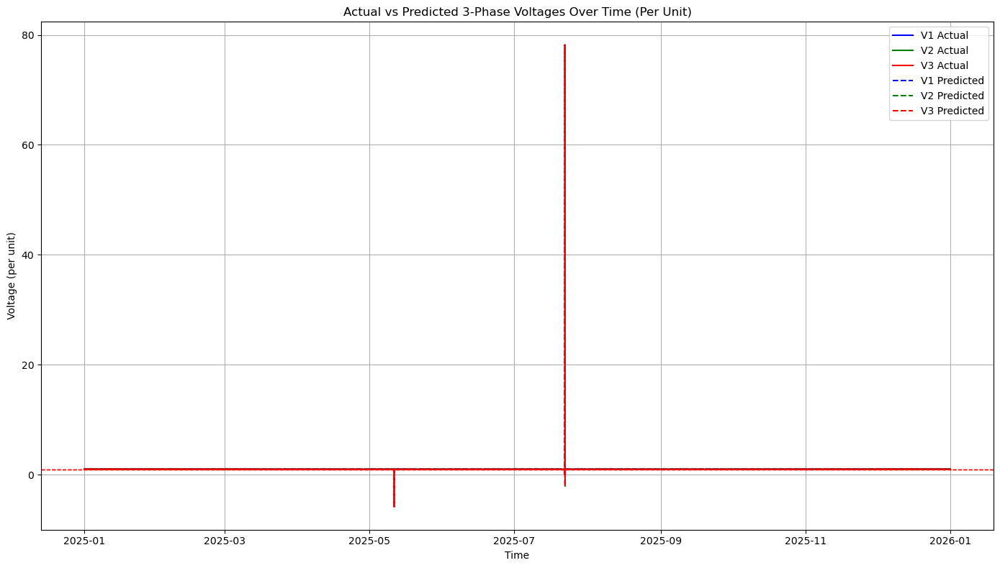

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load actual and predicted voltage data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
predicted_df = pd.read_csv("LR_PredictedVoltage.csv")
time_df = pd.read_csv("Time_Stamptest.csv")

# Automatically infer datetime format
time_stamps = pd.to_datetime("2025-" + time_df.iloc[:, 0], errors='coerce')

# Base voltage for per unit conversion
base_voltage = 4160 / np.sqrt(3)

# Convert voltages to per unit
actual_df_pu = actual_df / base_voltage
predicted_df_pu = predicted_df / base_voltage

# Save the predicted per unit voltages to a CSV file
predicted_df_pu.to_csv("LR_PredictedVoltageNewPU.csv", index=False)
print("Predicted per unit voltages have been saved to 'PredictedVoltageNewPU.csv'.")

# Plot actual and predicted voltages in per unit
plt.figure(figsize=(14, 8))

# Plot actual voltages
plt.plot(time_stamps, actual_df_pu['V1'], label='V1 Actual', color='blue')
plt.plot(time_stamps, actual_df_pu['V2'], label='V2 Actual', color='green')
plt.plot(time_stamps, actual_df_pu['V3'], label='V3 Actual', color='red')

# Plot predicted voltages
plt.plot(time_stamps, predicted_df_pu['LR_Predicted_V1'], label='V1 Predicted', color='blue', linestyle='--')
plt.plot(time_stamps, predicted_df_pu['LR_Predicted_V2'], label='V2 Predicted', color='green', linestyle='--')
plt.plot(time_stamps, predicted_df_pu['LR_Predicted_V3'], label='V3 Predicted', color='red', linestyle='--')

# Add horizontal dashed lines at 0.95 and 1.0 per unit
plt.axhline(y=0.95, color='red', linestyle='--', linewidth=1)
plt.axhline(y=1.0, color='red', linestyle='--', linewidth=1)

# Customize plot
plt.xlabel('Time')
plt.ylabel('Voltage (per unit)')
plt.title('Actual vs Predicted 3-Phase Voltages Over Time (Per Unit)')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()



#### XGB and Actual Voltage

Predicted per unit voltages have been saved to 'PredictedVoltageNewPU.csv'.


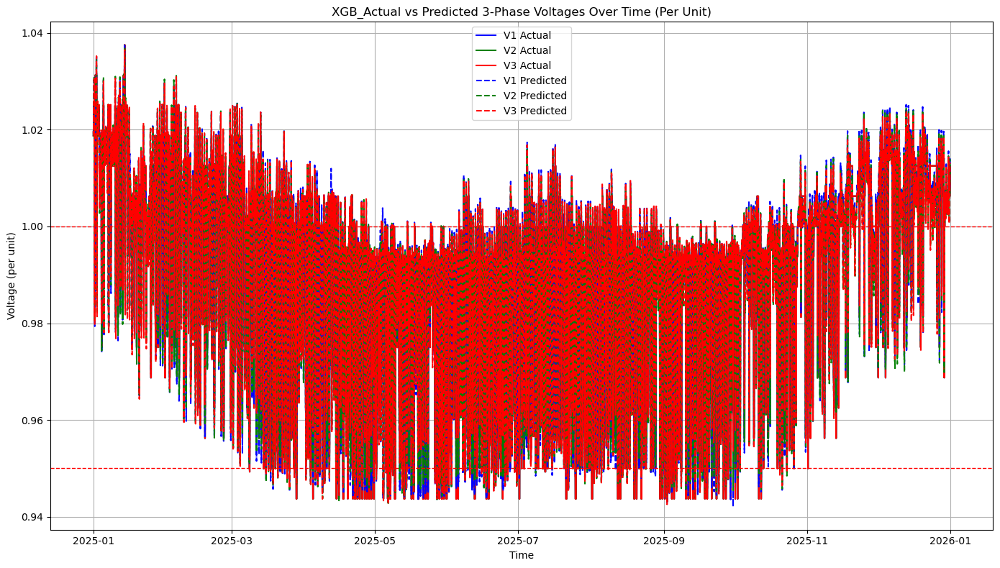

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load actual and predicted voltage data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
predicted_df = pd.read_csv("XGB_PredictedVoltage.csv")
time_df = pd.read_csv("Time_Stamptest.csv")

# Automatically infer datetime format
time_stamps = pd.to_datetime("2025-" + time_df.iloc[:, 0], errors='coerce')

# Base voltage for per unit conversion
base_voltage = 4160 / np.sqrt(3)

# Convert voltages to per unit
actual_df_pu = actual_df / base_voltage
predicted_df_pu = predicted_df / base_voltage

# Save the predicted per unit voltages to a CSV file
predicted_df_pu.to_csv("XGB_PredictedVoltageNewPU.csv", index=False)
print("Predicted per unit voltages have been saved to 'PredictedVoltageNewPU.csv'.")

# Plot actual and predicted voltages in per unit
plt.figure(figsize=(14, 8))

# Plot actual voltages
plt.plot(time_stamps, actual_df_pu['V1'], label='V1 Actual', color='blue')
plt.plot(time_stamps, actual_df_pu['V2'], label='V2 Actual', color='green')
plt.plot(time_stamps, actual_df_pu['V3'], label='V3 Actual', color='red')

# Plot predicted voltages
plt.plot(time_stamps, predicted_df_pu['XGB_Predicted_V1'], label='V1 Predicted', color='blue', linestyle='--')
plt.plot(time_stamps, predicted_df_pu['XGB_Predicted_V2'], label='V2 Predicted', color='green', linestyle='--')
plt.plot(time_stamps, predicted_df_pu['XGB_Predicted_V3'], label='V3 Predicted', color='red', linestyle='--')

# Add horizontal dashed lines at 0.95 and 1.0 per unit
plt.axhline(y=0.95, color='red', linestyle='--', linewidth=1)
plt.axhline(y=1.0, color='red', linestyle='--', linewidth=1)

# Customize plot
plt.xlabel('Time')
plt.ylabel('Voltage (per unit)')
plt.title('XGB_Actual vs Predicted 3-Phase Voltages Over Time (Per Unit)')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()



#### NN Voltage and Actual Voltage

Predicted per unit voltages have been saved to 'PredictedVoltageNewPU.csv'.


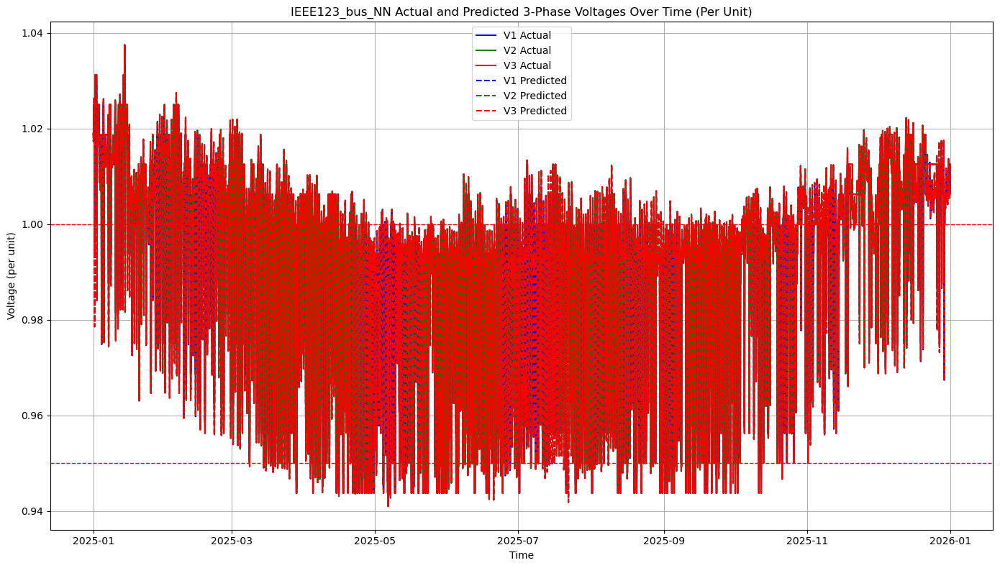

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load actual and predicted voltage data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
predicted_df = pd.read_csv("NN_PredictedVoltageNew.csv")
time_df = pd.read_csv("Time_Stamptest.csv")

# Automatically infer datetime format
time_stamps = pd.to_datetime("2025-" + time_df.iloc[:, 0], errors='coerce')

# Base voltage for per unit conversion
base_voltage = 4160 / np.sqrt(3)

# Convert voltages to per unit
actual_df_pu = actual_df / base_voltage
predicted_df_pu = predicted_df / base_voltage

# Save the predicted per unit voltages to a CSV file
predicted_df_pu.to_csv("NN_PredictedVoltageNewPU.csv", index=False)
print("Predicted per unit voltages have been saved to 'PredictedVoltageNewPU.csv'.")

# Plot actual and predicted voltages in per unit
plt.figure(figsize=(14, 8))

# Plot actual voltages
plt.plot(time_stamps, actual_df_pu['V1'], label='V1 Actual', color='blue')
plt.plot(time_stamps, actual_df_pu['V2'], label='V2 Actual', color='green')
plt.plot(time_stamps, actual_df_pu['V3'], label='V3 Actual', color='red')

# Plot predicted voltages
plt.plot(time_stamps, predicted_df_pu['NN_Predicted_V1'], label='V1 Predicted', color='blue', linestyle='--')
plt.plot(time_stamps, predicted_df_pu['NN_Predicted_V2'], label='V2 Predicted', color='green', linestyle='--')
plt.plot(time_stamps, predicted_df_pu['NN_Predicted_V3'], label='V3 Predicted', color='red', linestyle='--')

# Add horizontal dashed lines at 0.95 and 1.0 per unit
plt.axhline(y=0.95, color='red', linestyle='--', linewidth=1)
plt.axhline(y=1.0, color='red', linestyle='--', linewidth=1)

# Customize plot
plt.xlabel('Time')
plt.ylabel('Voltage (per unit)')
plt.title('IEEE123_bus_NN Actual and Predicted 3-Phase Voltages Over Time (Per Unit)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("IEEE123_bus_NN Actual vs Predicted 3-Phase Voltages Over Time.png")
# Show plot
plt.show()



#### Accuracy Comparison of all 3 models

In [27]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Load actual and predicted voltage data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
nn_df = pd.read_csv("NN_PredictedVoltageNew.csv")
lr_df = pd.read_csv("LR_PredictedVoltage.csv")
xgb_df = pd.read_csv("XGB_PredictedVoltage.csv")

# Extract actual and predicted values
actual = actual_df[["V1", "V2", "V3"]].values
nn_pred = nn_df[["NN_Predicted_V1", "NN_Predicted_V2", "NN_Predicted_V3"]].values
lr_pred = lr_df[["LR_Predicted_V1", "LR_Predicted_V2", "LR_Predicted_V3"]].values
xgb_pred = xgb_df[["XGB_Predicted_V1", "XGB_Predicted_V2", "XGB_Predicted_V3"]].values

# Function to compute metrics
def compute_metrics(true, pred):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    mape = mean_absolute_percentage_error(true, pred) * 100  # Convert to percentage
    p95 = np.percentile(np.abs(true - pred), 95)
    return rmse, mae, mape, p95

# Compute metrics for each model
nn_metrics = compute_metrics(actual, nn_pred)
lr_metrics = compute_metrics(actual, lr_pred)
xgb_metrics = compute_metrics(actual, xgb_pred)

# Create a summary DataFrame
metrics_df = pd.DataFrame({
    "Model": ["Neural Network", "Linear Regression", "XGBoost"],
    "RMSE": [nn_metrics[0], lr_metrics[0], xgb_metrics[0]],
    "MAE": [nn_metrics[1], lr_metrics[1], xgb_metrics[1]],
    "MAPE (%)": [nn_metrics[2], lr_metrics[2], xgb_metrics[2]],
    "95th Percentile Error": [nn_metrics[3], lr_metrics[3], xgb_metrics[3]]
})

# Save the metrics to a CSV file
metrics_df.to_csv("Model_Accuracy_Comparison.csv", index=False)

# Display the summary
metrics_df

,Model,RMSE,MAE,MAPE (%),95th Percentile Error
0,Neural Network,10.946660,7.880590,0.331727,18.489240
1,Linear Regression,2414.400559,48.664441,2.042682,23.715580
2,XGBoost,11.563629,7.794360,0.328508,21.477715


               Model         RMSE        MAE      MAPE  95th Percentile Error
0     Neural Network    10.946660   7.880590  0.331727              18.489240
1  Linear Regression  2414.400559  48.664441  2.042682              23.715580
2            XGBoost    11.563629   7.794360  0.328508              21.477715


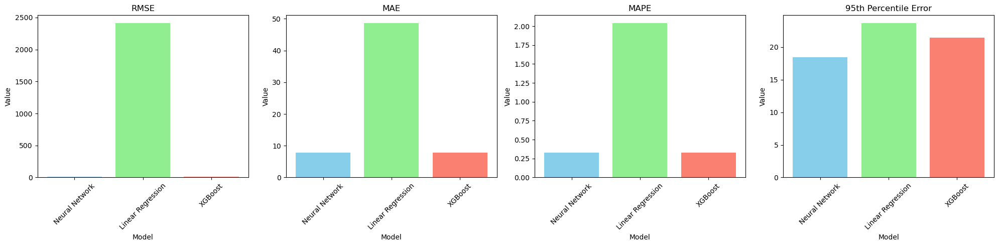

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Load actual and predicted voltage data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
nn_df = pd.read_csv("NN_PredictedVoltageNew.csv")
lr_df = pd.read_csv("LR_PredictedVoltage.csv")
xgb_df = pd.read_csv("XGB_PredictedVoltage.csv")

# Extract actual and predicted values
actual = actual_df[["V1", "V2", "V3"]].values
nn_pred = nn_df[["NN_Predicted_V1", "NN_Predicted_V2", "NN_Predicted_V3"]].values
lr_pred = lr_df[["LR_Predicted_V1", "LR_Predicted_V2", "LR_Predicted_V3"]].values
xgb_pred = xgb_df[["XGB_Predicted_V1", "XGB_Predicted_V2", "XGB_Predicted_V3"]].values

# Function to compute metrics
def compute_metrics(true, pred):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    mape = mean_absolute_percentage_error(true, pred)*100
    p95 = np.percentile(np.abs(true - pred), 95)
    return rmse, mae, mape, p95

# Compute metrics for each model
nn_metrics = compute_metrics(actual, nn_pred)
lr_metrics = compute_metrics(actual, lr_pred)
xgb_metrics = compute_metrics(actual, xgb_pred)

# Create a summary DataFrame
metrics_df = pd.DataFrame({
    "Model": ["Neural Network", "Linear Regression", "XGBoost"],
    "RMSE": [nn_metrics[0], lr_metrics[0], xgb_metrics[0]],
    "MAE": [nn_metrics[1], lr_metrics[1], xgb_metrics[1]],
    "MAPE": [nn_metrics[2], lr_metrics[2], xgb_metrics[2]],
    "95th Percentile Error": [nn_metrics[3], lr_metrics[3], xgb_metrics[3]]
})

# Save the metrics to a CSV file
metrics_df.to_csv("Model_Accuracy_Comparison.csv", index=False)

# Display the summary
print(metrics_df)

# Plotting each metric separately in a 1 by 4 subplot layout
metrics = ["RMSE", "MAE", "MAPE", "95th Percentile Error"]
models = metrics_df["Model"].values

fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=False)

for i, metric in enumerate(metrics):
    axes[i].bar(models, metrics_df[metric], color=['skyblue', 'lightgreen', 'salmon'])
    axes[i].set_title(metric)
    axes[i].set_ylabel('Value')
    axes[i].set_xlabel('Model')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig("Model_Performance_Comparison_Subplots.png")
plt.show()



In [30]:
### Dataset Outlier distribution

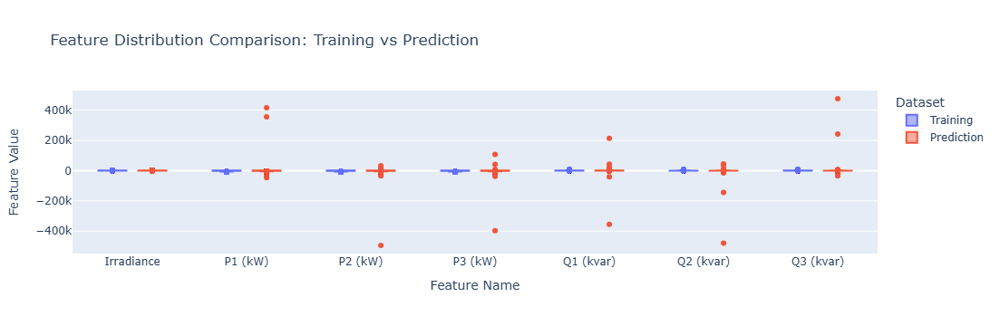

In [33]:
import pandas as pd
import plotly.express as px

# Load the training and prediction datasets
train_df = pd.read_csv("IEEE123PQTrain_Irrad.csv")
predict_df = pd.read_csv("IEEE123PQPredict_Irrad.csv")

# List of numeric features to compare
features_to_compare = [
    "Irradiance",
    "P1 (kW)", "P2 (kW)", "P3 (kW)",
    "Q1 (kvar)", "Q2 (kvar)", "Q3 (kvar)"
]

# Melt both datasets for comparison
train_melted = train_df[features_to_compare].melt(var_name="Feature", value_name="Value")
train_melted["Dataset"] = "Training"

predict_melted = predict_df[features_to_compare].melt(var_name="Feature", value_name="Value")
predict_melted["Dataset"] = "Prediction"

# Combine both for visualization
combined_df = pd.concat([train_melted, predict_melted], ignore_index=True)

# Create box plots for each feature comparing training and prediction distributions
plot = px.box(combined_df, x="Feature", y="Value", color="Dataset",
              title="Feature Distribution Comparison: Training vs Prediction",
              labels={"Value": "Feature Value", "Feature": "Feature Name"})

# Show the plot interactively
plot.show()

# Save the plot as a PNG file
plot.write_image("feature_distribution_comparison.png")

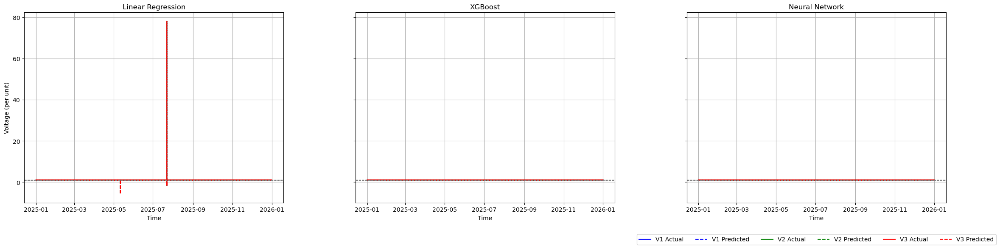

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
lr_pred = pd.read_csv("LR_PredictedVoltage.csv")
xgb_pred = pd.read_csv("XGB_PredictedVoltage.csv")
nn_pred = pd.read_csv("NN_PredictedVoltageNew.csv")
time_df = pd.read_csv("Time_Stamptest.csv")

# Convert time
time_stamps = pd.to_datetime("2025-" + time_df.iloc[:, 0], errors='coerce')

# Base voltage
base_voltage = 4160 / np.sqrt(3)

# Convert to per unit
actual_pu = actual_df / base_voltage
lr_pu = lr_pred / base_voltage
xgb_pu = xgb_pred / base_voltage
nn_pu = nn_pred / base_voltage

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 6), sharey=True)

models = [
    ("Linear Regression", lr_pu, ['LR_Predicted_V1', 'LR_Predicted_V2', 'LR_Predicted_V3']),
    ("XGBoost", xgb_pu, ['XGB_Predicted_V1', 'XGB_Predicted_V2', 'XGB_Predicted_V3']),
    ("Neural Network", nn_pu, ['NN_Predicted_V1', 'NN_Predicted_V2', 'NN_Predicted_V3'])
]

colors = ['blue', 'green', 'red']
labels = ['V1', 'V2', 'V3']

for i, (title, pred_df, pred_cols) in enumerate(models):
    ax = axes[i]
    for j in range(3):
        ax.plot(time_stamps, actual_pu[labels[j]], label=f'{labels[j]} Actual', color=colors[j])
        ax.plot(time_stamps, pred_df[pred_cols[j]], label=f'{labels[j]} Predicted', color=colors[j], linestyle='--')
    ax.axhline(y=0.95, color='gray', linestyle='--', linewidth=1)
    ax.axhline(y=1.0, color='gray', linestyle='--', linewidth=1)
    ax.set_title(title)
    ax.set_xlabel("Time")
    if i == 0:
        ax.set_ylabel("Voltage (per unit)")
    ax.grid(True)

# Add legend to the last subplot
axes[-1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=6)

plt.tight_layout()
plt.savefig("Voltage_Comparison_Subplots.png", bbox_inches='tight')
plt.show()

#### Subplots with different axis

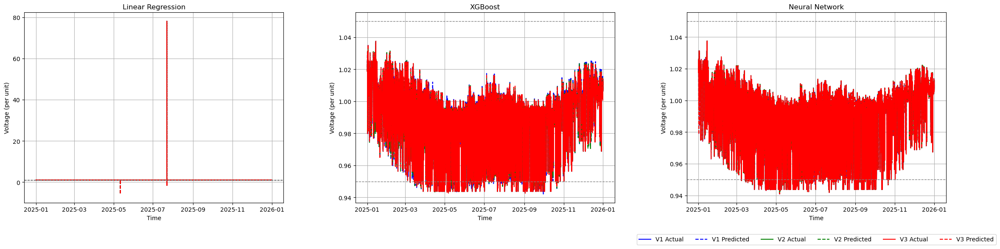

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load data
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
lr_pred = pd.read_csv("LR_PredictedVoltage.csv")
xgb_pred = pd.read_csv("XGB_PredictedVoltage.csv")
nn_pred = pd.read_csv("NN_PredictedVoltageNew.csv")
time_df = pd.read_csv("Time_Stamptest.csv")

# Convert time
time_stamps = pd.to_datetime("2025-" + time_df.iloc[:, 0], errors='coerce')

# Base voltage
base_voltage = 4160 / np.sqrt(3)

# Convert to per unit
actual_pu = actual_df / base_voltage
lr_pu = lr_pred / base_voltage
xgb_pu = xgb_pred / base_voltage
nn_pu = nn_pred / base_voltage

# Create subplots with independent y-axes
fig, axes = plt.subplots(1, 3, figsize=(24, 6), sharey=False)

models = [
    ("Linear Regression", lr_pu, ['LR_Predicted_V1', 'LR_Predicted_V2', 'LR_Predicted_V3']),
    ("XGBoost", xgb_pu, ['XGB_Predicted_V1', 'XGB_Predicted_V2', 'XGB_Predicted_V3']),
    ("Neural Network", nn_pu, ['NN_Predicted_V1', 'NN_Predicted_V2', 'NN_Predicted_V3'])
]

colors = ['blue', 'green', 'red']
labels = ['V1', 'V2', 'V3']

for i, (title, pred_df, pred_cols) in enumerate(models):
    ax = axes[i]
    for j in range(3):
        ax.plot(time_stamps, actual_pu[labels[j]], label=f'{labels[j]} Actual', color=colors[j])
        ax.plot(time_stamps, pred_df[pred_cols[j]], label=f'{labels[j]} Predicted', color=colors[j], linestyle='--')
    ax.axhline(y=0.95, color='gray', linestyle='--', linewidth=1)
    ax.axhline(y=1.05, color='gray', linestyle='--', linewidth=1)
    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Voltage (per unit)")
    ax.grid(True)

# Add legend to the last subplot
axes[-1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=6)

plt.tight_layout()
plt.savefig("Voltage_Comparison_Subplots_Independent_Y.png", bbox_inches='tight')
plt.show()

#### Presentation plots

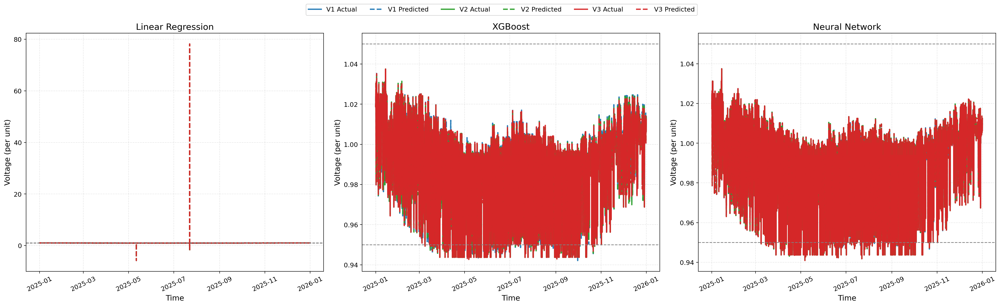

In [8]:

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

# ---- Presentation: legible fonts & high resolution ----
mpl.rcParams['figure.dpi'] = 200            # On-screen clarity
mpl.rcParams['savefig.dpi'] = 300           # Export clarity (print-quality)
mpl.rcParams['font.family'] = 'DejaVu Sans' # Readable default
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.titlesize'] = 15
mpl.rcParams['axes.labelsize'] = 13
mpl.rcParams['legend.fontsize'] = 11
mpl.rcParams['xtick.labelsize'] = 11
mpl.rcParams['ytick.labelsize'] = 11
mpl.rcParams['axes.grid'] = True
mpl.rcParams['grid.linestyle'] = '--'
mpl.rcParams['grid.alpha'] = 0.3

# ---- Load data ----
actual_df = pd.read_csv("IEEE123VoltageActual.csv")
lr_pred   = pd.read_csv("LR_PredictedVoltage.csv")
xgb_pred  = pd.read_csv("XGB_PredictedVoltage.csv")
nn_pred   = pd.read_csv("NN_PredictedVoltageNew.csv")
time_df   = pd.read_csv("Time_Stamptest.csv")

# ---- Convert time ----
# Assumes time_df first column holds strings like 'MM-DD HH:MM:SS' -> prepend year '2025-'
time_stamps = pd.to_datetime("2025-" + time_df.iloc[:, 0].astype(str), errors='coerce')

# ---- Base voltage & per unit conversion ----
base_voltage = 4160 / np.sqrt(3)
actual_pu = actual_df / base_voltage
lr_pu     = lr_pred   / base_voltage
xgb_pu    = xgb_pred  / base_voltage
nn_pu     = nn_pred   / base_voltage

# ---- Subplots with independent y-axes ----
fig, axes = plt.subplots(1, 3, figsize=(24, 7), sharey=False)

models = [
    ("Linear Regression", lr_pu,  ['LR_Predicted_V1',  'LR_Predicted_V2',  'LR_Predicted_V3']),
    ("XGBoost",           xgb_pu, ['XGB_Predicted_V1', 'XGB_Predicted_V2', 'XGB_Predicted_V3']),
    ("Neural Network",    nn_pu,  ['NN_Predicted_V1',  'NN_Predicted_V2',  'NN_Predicted_V3'])
]

# Consistent colors for phases; dashed for predictions
phase_colors = {'V1': '#1f77b4', 'V2': '#2ca02c', 'V3': '#d62728'}  # blue, green, red
labels = ['V1', 'V2', 'V3']

handles_for_legend = []

for i, (title, pred_df, pred_cols) in enumerate(models):
    ax = axes[i]

    # Plot actual and predicted with readable line widths
    for j, phase in enumerate(labels):
        # Actual
        line_actual, = ax.plot(
            time_stamps,
            actual_pu[phase],
            label=f'{phase} Actual',
            color=phase_colors[phase],
            linewidth=2.2,
            alpha=0.95
        )
        # Predicted (dashed)
        line_pred, = ax.plot(
            time_stamps,
            pred_df[pred_cols[j]],
            label=f'{phase} Predicted',
            color=phase_colors[phase],
            linestyle='--',
            linewidth=2.2,
            alpha=0.95
        )
        if i == 0:
            # Collect legend handles only once
            handles_for_legend.extend([line_actual, line_pred])

    # Voltage band lines (ANSI typical ±5%)
    ax.axhline(y=0.95, color='gray', linestyle='--', linewidth=1.2)
    ax.axhline(y=1.05, color='gray', linestyle='--', linewidth=1.2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Voltage (per unit)")
    ax.grid(True)

    # Improve time tick readability
    ax.tick_params(axis='x', labelrotation=25)

# Shared legend below the subplots (centered), readable and unclipped
# De-duplicate handles while preserving order
unique_labels = []
unique_handles = []
for h in handles_for_legend:
    lbl = h.get_label()
    if lbl not in unique_labels:
        unique_labels.append(lbl)
        unique_handles.append(h)

fig.legend(unique_handles, unique_labels,
           loc='upper center',
           bbox_to_anchor=(0.5, 1.05),
           ncol=6,
           frameon=True)

plt.tight_layout()
plt.savefig("Voltage_Comparison_Subplots_Independent_Y.png", bbox_inches='tight')
plt.show()

#### Plot of different model ouputs and Actual Voltage